# Perturbing expression in malignant cells

I generated two sets of 50 simulated bulk RNA-seq samples
- Same set of fraction vectors for each set
- Same cell type GEPs sampled for each set
- For one set, 100 genes were perturbed by various factors of 2 ($\{ \frac{1}{8}, \frac{1}{4}, ..., 4, 8 \}$)


## imports + setup

In [1]:
import logging
import warnings

import helpers
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from upath import UPath

In [2]:
warnings.filterwarnings("ignore", message="divide by zero")
warnings.filterwarnings("ignore", message="invalid value encountered in double_scalars")

In [3]:
logger = logging.getLogger(__name__)
logger.setLevel("DEBUG")

stream_handler = logging.StreamHandler()
stream_handler.setFormatter(helpers.logging.formatter)
stream_handler.setLevel("DEBUG")
logging.getLogger().addHandler(stream_handler)

In [4]:
logging.getLogger("helpers").setLevel("DEBUG")

In [5]:
path_root = UPath(
    "gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s"
)

In [54]:
path_root

GCSPath('gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s')

In [58]:
p = path_root / "**/CIBERSORTxHiRes_NA_Malignant_Window36.txt"
!gsutil ls -hlR $p

 32.11 MiB  2022-09-27T16:51:14Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_factor=0.125/outdir/CIBERSORTxHiRes_NA_Malignant_Window36.txt
 32.11 MiB  2022-09-27T16:55:46Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_factor=0.250/outdir/CIBERSORTxHiRes_NA_Malignant_Window36.txt
 32.14 MiB  2022-09-27T17:00:08Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_factor=0.500/outdir/CIBERSORTxHiRes_NA_Malignant_Window36.txt
 32.11 MiB  2022-09-27T17:04:31Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_factor=2.000/outdir/CIBERSORTxHiRes_NA_Malignant_Window36.txt
  32.1 MiB  2022-09-27T17:08:48Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_factor=4.000/outdir/CIBERSORTxHiRes_NA_Malignant_Window36.txt
 32.08 MiB  2022-09-27T17:13:10Z  gs://liulab/cibersortx/perturbed_malignant_expression/20220927_16h46m41s/scaling_

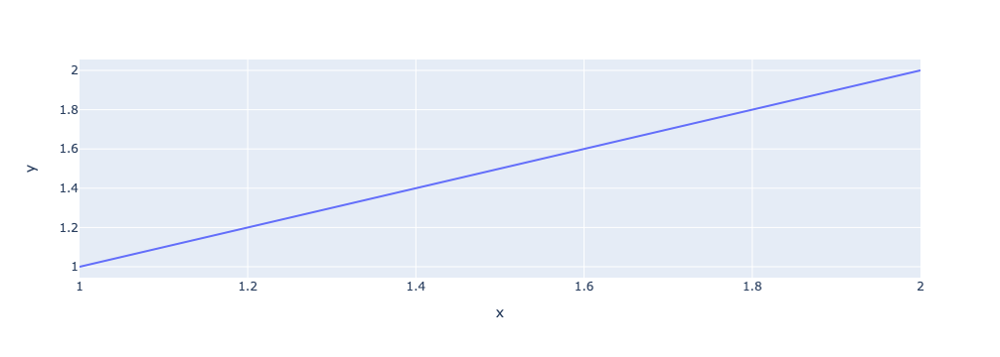

In [7]:
# janky plotly hack
px.line(x=[1, 2], y=[1, 2])

In [41]:
import importlib

importlib.reload(helpers)
importlib.reload(helpers.deg_analysis)
importlib.reload(helpers.running_cibersortx.reading_output_files)

<module 'helpers.running_cibersortx.reading_output_files' from '/home/jupyter/deconv/helpers/running_cibersortx/reading_output_files.py'>

## Comparing gene expression in simulated bulk RNA-seq

In [61]:
def compute_gene_data(df_rnaseq):
    groups = df_bulk_rnaseq.groupby("gene_symbol")
    df_gene_stats = helpers.deg_analysis.compute_stats(
        groups, "group_id", "control", scaling_factor_str
    )
    df_genes_perturbed = pd.read_csv(
        "gs://liulab/simulated/perturbed_malignant_expression/20220927_15h33m26s/genes_perturbed.csv"
    )["gene_symbol"]
    df_gene_stats["perturbed"] = df_gene_stats["gene_symbol"].isin(df_genes_perturbed)
    fig = helpers.deg_analysis.make_volcano_figure(df_gene_stats, perturbed=True)
    fig.update_layout(
        title="Differential expression in independent, identically-generated in silico cohorts"
    )
    return df_gene_stats


for scaling_factor in [2.0**n for n in [-3, -2, -1, 1, 2, 3]]:
    scaling_factor_str = f"scaling_factor={scaling_factor:.3f}"
    logger.debug("reading %s bulk rna-seq", scaling_factor_str)
    df_bulk_rnaseq = helpers.data_io_and_formatting.load_concatenated_bulk_rnaseq(
        path_root / scaling_factor_str / "data" / "bulkrnaseq.txt"
    )
    print(df_bulk_rnaseq.sample(5))
    df_bulk_gene_stats = compute_gene_data(df_bulk_rnaseq)
    fig_bulk = helpers.deg_analysis.make_volcano_figure(df_gene_stats, perturbed=True)
    fig_bulk.update_layout(
        title="Differential expression in independent, identically-generated in silico cohorts"
    )

    logger.debug("reading %s malignant inferred", scaling_factor_str)
    path_malignant_inferred = (
        path_root
        / scaling_factor_str
        / "outdir"
        / "CIBERSORTxHiRes_NA_Malignant_Window*txt"
    )
    df_malignant_inferred = (
        helpers.running_cibersortx.reading_output_files.read_hires_cell_type_geps(
            path_malignant_inferred
        ).loc["Malignant"]
    )
    df_malignant_inferred.index = pd.MultiIndex.from_arrays(
        [
            df_malignant_inferred.index.get_level_values("gene_symbol"),
            df_malignant_inferred.index.get_level_values("sample_id").map(
                lambda x: x.split("/")[0]
            ),
            df_malignant_inferred.index.get_level_values("sample_id").map(
                lambda x: x.split("/")[1]
            ),
        ],
        names=["gene_symbol", "group_id", "sample_id"],
    )
    print(df_malignant_inferred.sample(5))
    df_malignant_inferred_gene_stats = compute_gene_data(df_malignant_inferred)
    fig_malignant_inferred = helpers.deg_analysis.make_volcano_figure(
        df_malignant_inferred_gene_stats, perturbed=True
    )
    break

gene_symbol  group_id              sample_id 
MRPL47       control               sample_010     81.678995
CHRNB2       control               sample_018      4.705845
MBP          scaling_factor=0.125  sample_014    283.256780
KLHL21       scaling_factor=0.125  sample_023    112.637042
FCGR3B       control               sample_021      3.655763
dtype: float64
gene_symbol  group_id              sample_id 
COQ5         control               sample_025    10.769513
IL32         scaling_factor=0.125  sample_039    50.331186
CHST8        scaling_factor=0.125  sample_049     1.000000
TNFSF14      control               sample_019    58.677832
CRK          control               sample_037    50.773342
dtype: float64


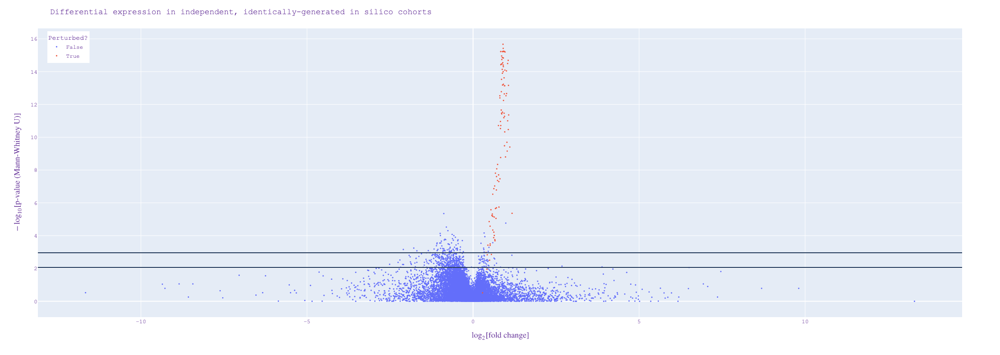

In [62]:
fig_bulk

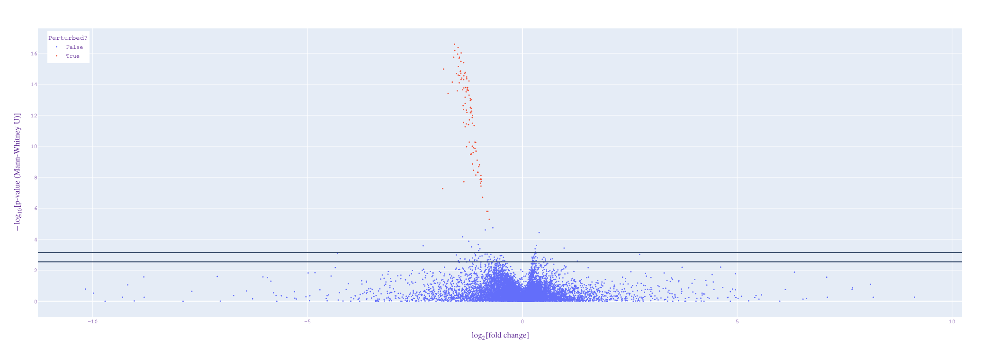

In [63]:
fig_malignant_inferred

In [8]:
scaling_factor = 2.0
scaling_factor_str = f"scaling_factor={scaling_factor:.3f}"

In [9]:
df_bulk_rnaseq = helpers.data_io_and_formatting.load_concatenated_bulk_rnaseq(
    path_root / scaling_factor_str / "data" / "bulkrnaseq.txt"
)

In [11]:
groups = df_bulk_rnaseq.groupby("gene_symbol")
df_gene_stats = helpers.deg_analysis.compute_stats(
    groups, "group_id", "control", scaling_factor_str
)
df_gene_stats

,gene_symbol,pval,fold_change,sparsity_overall,-log10_pval,log2_fold_change,-log10_pval_signed,significant_bh_fdr=0.10,significant_bh_fdr=0.25
0,A1BG,0.743323,1.116247,0.00,0.128823,0.158656,0.128823,False,False
1,A2M,0.357403,0.891276,0.00,0.446842,-0.166056,-0.446842,False,False
2,A2ML1,0.882171,0.986261,0.00,0.054447,-0.019958,-0.054447,False,False
3,A4GALT,0.595502,0.740089,0.06,0.225117,-0.434230,-0.225117,False,False
4,A4GNT,0.520712,0.507099,0.90,0.283403,-0.979661,-0.283403,False,False
...,...,...,...,...,...,...,...,...,...
16058,ZYG11A,0.402256,0.864073,0.00,0.395498,-0.210776,-0.395498,False,False
16059,ZYG11B,0.471276,0.917346,0.00,0.326725,-0.124461,-0.326725,False,False
16060,ZYX,0.063185,0.816857,0.00,1.199383,-0.291844,-1.199383,False,False
16061,ZZEF1,0.080536,0.872435,0.00,1.094009,-0.196881,-1.094009,False,False


In [13]:
df_gene_stats["significant_bh_fdr=0.25"].value_counts()

False    15511
True       552
Name: significant_bh_fdr=0.25, dtype: int64

In [26]:
df_genes_perturbed = pd.read_csv(
    "gs://liulab/simulated/perturbed_malignant_expression/20220927_15h33m26s/genes_perturbed.csv"
)["gene_symbol"]

In [30]:
df_gene_stats["perturbed"] = df_gene_stats["gene_symbol"].isin(df_genes_perturbed)

In [31]:
df_gene_stats["perturbed"].value_counts()

False    15963
True       100
Name: perturbed, dtype: int64

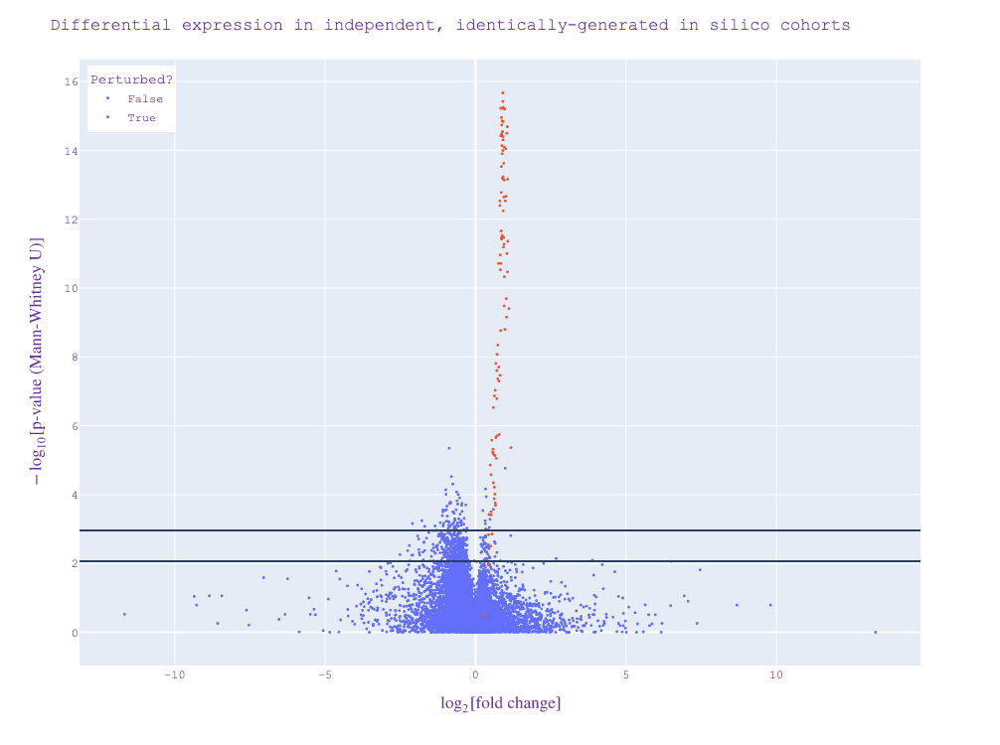

In [34]:
fig = helpers.deg_analysis.make_volcano_figure(df_gene_stats, perturbed=True)
fig.update_layout(
    title="Differential expression in independent, identically-generated in silico cohorts"
)
fig

### Comparing gene expression in malignant cells, inferred by CIBERSORTx

In [ ]:
path_pattern = (
    path_root
    / "scaling_factor=2.0"
    / "outdir"
    / "CIBERSORTxHiRes_NA_Malignant_Window*txt"
)
df_rnaseq_inferred_malignant_ = helpers.running_cibersortx.read_hires_cell_type_geps(
    path_pattern
)

In [ ]:
def _(df):
    df = df.copy()
    df.index = pd.MultiIndex.from_tuples(
        df.index.map(lambda x: (x[1],) + tuple(x[2].split("/"))),
        names=["GeneSymbol", "cohort_id", "sample_id"],
    )
    df = df.unstack("cohort_id")
    return df


df_rnaseq_inferred_malignant = _(df_rnaseq_inferred_malignant_)

In [ ]:
df_rnaseq_inferred_malignant

In [ ]:
df_rnaseq_inferred_malignant_stats = helpers.deg_analysis.compute_stats(
    df_rnaseq_inferred_malignant.groupby("GeneSymbol")
)
df_rnaseq_inferred_malignant_stats

In [ ]:
fig = helpers.deg_analysis.make_volcano_figure(df_rnaseq_inferred_malignant_stats)
fig.update_layout(
    title="Differential expression analysis of inferred gene expression<br>in malignant cells, by CIBERSORTx"
)
fig